In [1]:
## Explainability
#!pip install -r requirements.txt --user

import pandas as pd
import matplotlib
matplotlib.__version__


'3.1.0'

In [2]:
#Loading COO Matrices - sparse with OHE of all original Features
def load_models():
    from sklearn.externals import joblib
    from keras.models import load_model
    sklearn_nn_file = 'models/UCI_Census/SklearnNeuralNet.pkl'
    keras_ann_file = 'models/UCI_Census/ann_gridsearch.h5'
    rf_file = "models/UCI_Census/random_forest.pkl"
    gbc_file = "models/UCI_Census/GBC.pkl"
    logit_file = "models/UCI_Census/Logit.pkl"

    rfc = joblib.load(rf_file)
    gbc = joblib.load(gbc_file)
    logit = joblib.load(logit_file)
    keras_ann = load_model(keras_ann_file)
    sk_ann = joblib.load(sklearn_nn_file)
    return rfc, gbc, logit, keras_ann, sk_ann


def save_obj(obj, name):
    import pickle
    with open('obj/' + name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)


def load_obj(name):
    import pickle
    with open('obj/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

Load Data Objects. Stored these locally/remotely to avoid dependency issues

In [3]:
feature_names = [
    "Age", "Workclass", "fnlwgt", "Education", "Education-Num",
    "Marital Status", "Occupation", "Relationship", "Race", "Sex",
    "Capital Gain", "Capital Loss", "Hours per week", "Country"
]

categorical_features = [1, 3, 5, 6, 7, 8, 9,
                        13]  #Get Nominal / Ordinal / etc..

X_train = load_obj('X_train')
X_test = load_obj('X_test')
y_train = load_obj('y_train')
y_test = load_obj('y_test')

encoded_train = load_obj('encoded_train')
encoded_test = load_obj('encoded_test')
categorical_names = load_obj('categorical_names')
data = load_obj('data')
encoder = load_obj('encoder')

C:\Users\jdine\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:306: UserWarning: Trying to unpickle estimator OneHotEncoder from version 0.20.3 when using version 0.21.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


Some statistics on our models

In [4]:
rfc, gbc, logit, keras_ann, sk_ann = load_models()

#Some classification Reports and Confusion Matrices
import sklearn
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

class_names = ['<50k', '>50k']

get_best_score = lambda x,y: sklearn.metrics.accuracy_score(x, y.predict(encoded_test))

rf_best_score = get_best_score(y_test, rfc)
gbc_best_score = get_best_score(y_test, gbc)
lr_best_score = get_best_score(y_test, logit)
nn_best_score = get_best_score(y_test, sk_ann)
ker_nn_best_score = sklearn.metrics.accuracy_score(
    y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))

C:\Users\jdine\AppData\Roaming\Python\Python37\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)
Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [5]:
print("\033[1mPrinting Test Accuracy.... \033[0m")
print("Random Forest: {0:.2f} %".format(rf_best_score * 100))
print("Gradient Boosting: {0:.2f} %".format(gbc_best_score * 100))
print("Logistic Regression: {0:.2f} %".format(lr_best_score * 100))
print("SKLEARN Neural Net: {0:.2f} %".format(nn_best_score * 100))
print("Keras Neural Net: {0:.2f} % \n \n".format(ker_nn_best_score * 100))

Printing Test Accuracy.... 
Random Forest: 97.55 %
Gradient Boosting: 88.58 %
Logistic Regression: 82.45 %
SKLEARN Neural Net: 68.87 %
Keras Neural Net: 75.01 % 
 



In [6]:
from pylab import rcParams
from helpful_util import plot_confusion_matrix
import matplotlib.pyplot as plt
rcParams['figure.figsize'] = 3, 3  #Adjust plot size

print("\033[1m Random Forest Classification Report...\n \033[0m")
print(classification_report(y_test, rfc.predict(encoded_test)))
cm = confusion_matrix(y_test, rfc.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m Gradient Boosting Classification Report...\n \033[0m")
print(classification_report(y_test, gbc.predict(encoded_test)))
cm = confusion_matrix(y_test, gbc.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m Logistic Regression Classification Report...\n \033[0m")
print(classification_report(y_test, logit.predict(encoded_test)))
cm = confusion_matrix(y_test, logit.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m SKLEARN Neural Network Classification Report...\n \033[0m")
print(classification_report(y_test, sk_ann.predict(encoded_test)))
cm = confusion_matrix(y_test, sk_ann.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m KERAS Neural Network Classification Report...\n \033[0m")
print(
    classification_report(
        y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1)))
cm = confusion_matrix(
    y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

 Random Forest Classification Report...
 
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1484
           1       0.96      0.99      0.98      1581

    accuracy                           0.98      3065
   macro avg       0.98      0.97      0.98      3065
weighted avg       0.98      0.98      0.98      3065



<Figure size 300x300 with 2 Axes>

 Gradient Boosting Classification Report...
 
              precision    recall  f1-score   support

           0       0.91      0.85      0.88      1484
           1       0.87      0.92      0.89      1581

    accuracy                           0.89      3065
   macro avg       0.89      0.88      0.89      3065
weighted avg       0.89      0.89      0.89      3065



<Figure size 300x300 with 2 Axes>

 Logistic Regression Classification Report...
 
              precision    recall  f1-score   support

           0       0.84      0.79      0.81      1484
           1       0.81      0.86      0.83      1581

    accuracy                           0.82      3065
   macro avg       0.83      0.82      0.82      3065
weighted avg       0.83      0.82      0.82      3065



<Figure size 300x300 with 2 Axes>

 SKLEARN Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.62      0.94      0.75      1484
           1       0.90      0.45      0.60      1581

    accuracy                           0.69      3065
   macro avg       0.76      0.70      0.67      3065
weighted avg       0.76      0.69      0.67      3065



<Figure size 300x300 with 2 Axes>

 KERAS Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.84      0.60      0.70      1484
           1       0.70      0.89      0.79      1581

    accuracy                           0.75      3065
   macro avg       0.77      0.75      0.74      3065
weighted avg       0.77      0.75      0.74      3065



<Figure size 300x300 with 2 Axes>

Graphs Showing Standard Feature Importance via Sklearn API


In [7]:
#SciKit Learn Feature Importance in Linear Coefficient Rankinks

rcParams['figure.figsize'] = 5, 5  #Adjust plot size
import seaborn as sns

#all features as a list. Unwrapping encoding
features = []
for k in categorical_names.values():
    for i in k:
        features.append(i)

continuous = [
    'age', 'fnlwgt', 'Education-Num', 'capital_gain', 'capital_loss',
    'hrs_per_week'
]

features = features + continuous 

In [8]:
def display_sklearn_feature_importance(data, n_features):
    '''
    Parameters:
    data: data object; coomatrix w/ encoded features
    n_features: number of features to visualize
    
    Returns:
    Graph of basic feature importance measurements
    
    '''
    feature_importance = pd.DataFrame({
        "feature":
        features,
        "RF_Feature_Importance":
        np.round(rfc.feature_importances_, 4),
        "GBC_Feature_Importance":
        np.round(gbc.feature_importances_, 4),
        "Logit_Coeff":
        np.round(logit.coef_[0], 4),
        "Max_Feature_Val":
        pd.DataFrame(data.toarray(), columns=features).max(),
    })

    n = n_features
    feature_importance['coeff_max'] = feature_importance[
        'Logit_Coeff'] * feature_importance['Max_Feature_Val']
    temp = feature_importance.nlargest(n, 'RF_Feature_Importance')
    sns.barplot(temp['RF_Feature_Importance'], temp['feature'])
    plt.title('Random Forest - Feature Importance Top {}'.format(n_features))
    plt.show()

    temp = feature_importance.nlargest(n, 'GBC_Feature_Importance')
    sns.barplot(temp['GBC_Feature_Importance'], temp['feature'])
    plt.title('Gradient Boosted Classifier - Feature Importance Top {}'.format(
        n_features))
    plt.show()

    #We want to show the total possible feature impact here. Take the max of each feature in the training set by the logit coeff.
    lookup = pd.DataFrame(data.toarray(), columns=features).max()
    temp = feature_importance.nlargest(int(n / 2), 'coeff_max')
    temp1 = feature_importance.nsmallest(int(n / 2), 'coeff_max')
    temp = pd.concat([temp, temp1])
    sns.barplot(temp['coeff_max'], temp['feature'])
    plt.title('Logistic Regression - Coefficients Top&Bottom {}'.format(
        int(n_features / 2)))
    plt.show()

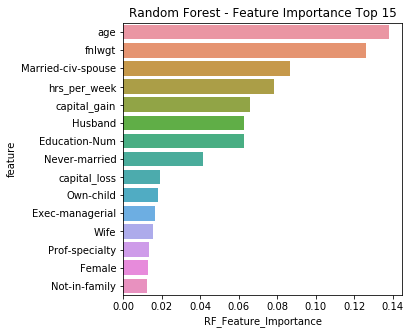

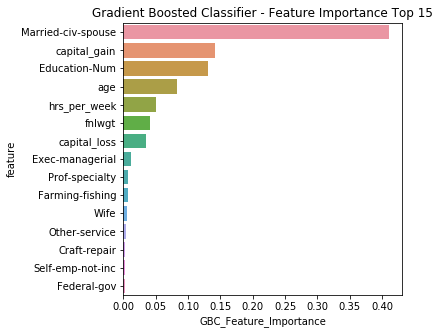

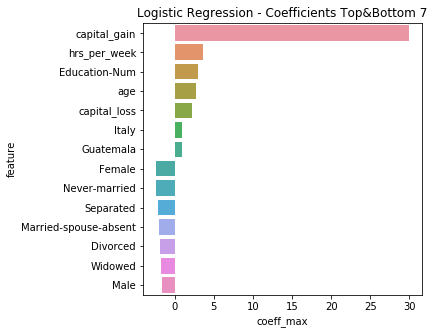

In [9]:
display_sklearn_feature_importance(data = encoded_train , n_features=15)

Exploring with Manual Feature Perturbation

In [10]:
#Split 
#Manual perturbations
%matplotlib inline
sns.set_style('whitegrid')
X_test_holdout = load_obj('X_test')
idx = np.random.choice(X_test_holdout.shape[0], 2000, replace=False) #Random 2000 samples w/o replacements
X_test_holdout =X_test_holdout[idx] #extract
X_test_holdout = pd.DataFrame(encoder.transform(X_test_holdout).toarray(), columns = features) #Convert to DF for column names

In [11]:
def perturb_graph(model, data, column, title = 'Label with Model Type: GBC/RFC/etc..'):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
        data: df object
        column: pass dataframe column, e.g, age, fnlwgt etc. Can pass a list of columns, e.g., ['age', 'fnlwgt']
        title: str; pass title of graph    
    
    Returns:
        Forecasting Graph based on perturbed features.
    
    '''
    rcParams['figure.figsize'] = 13, 10  #Adjust plot size

    clone = data.copy()
    column = column

    base_value = model.predict_proba(clone.median().values.reshape(
        (1, clone.shape[1])))[:, 1] * 100

    a = [str(i) + '%' for i in range(50, 151) if i % 5 == 0]
    b = [(i / 100) for i in range(50, 151) if i % 5 == 0]
    pertu = dict(zip(a, b))
    pert = [i for i in pertu.values()]

    preds = []
    mean = []
    for i in pert:
        clone[column] = X_test_holdout[column] * (i)
        mean.append(str(column) + ':' + str(np.round(clone[column].mean())))
        preds.append(
            model.predict_proba(clone.median().values.reshape(
                (1, clone.shape[1])))[:, 1][0] * 100)

    fig, ax1 = plt.subplots(1, 1, figsize=(15, 4))
    sns.lineplot(x=pert, y=preds, ax=ax1)
    ax1.axhline(base_value, ls='--', color='k')
    ax1.axhline(50, ls='--', color='r')
    ax1.axvline(1.0, ls='--', color='k')
    #ax1.text(.5,.72, "Base Value - Prediction over Median ", fontsize=13)
    ax1.set_title('Probability Against Perturbation {}: {}'.format(
        column.upper(), title),
                  fontsize=25)
    ax1.set_xlabel('{} Perturbation'.format(column.upper()), fontsize=15)
    ax1.set_ylabel('Probability of Class 1 %', fontsize=15)
    plt.legend(title='Legend',
               loc='lower right',
               labels=[
                   'Perturbed - Probability',
                   'Base Value - Prediction over Median',
                   'Prediction Threshold'
               ])

    if isinstance(column, str):
        #ax2 = ax1.twinx()
        #ax2.set_ylabel('Average {}'.format(column), fontsize=15)
        #sns.scatterplot(x = pert, y = mean, ax = ax2, color = 'b')
        for i, txt in enumerate(mean):
            if i % 3 == 0:
                ax1.annotate(txt, (pert[i], preds[i]))
    #ax2.title.set_text('Avg. Age over Samples')
    #ax2.set_xlabel('Age Perturbation', fontsize=15)
    #ax2.set_ylabel('Average Age', fontsize=15)

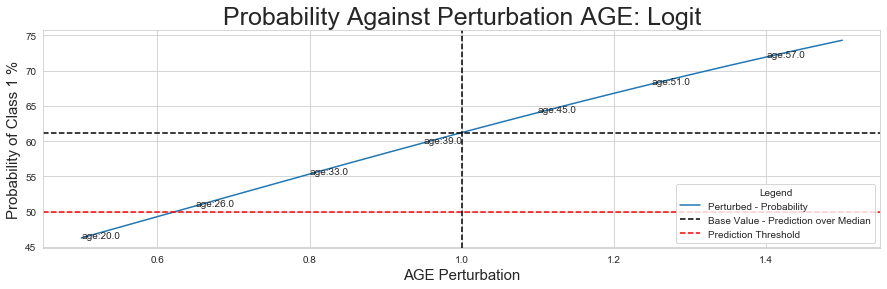

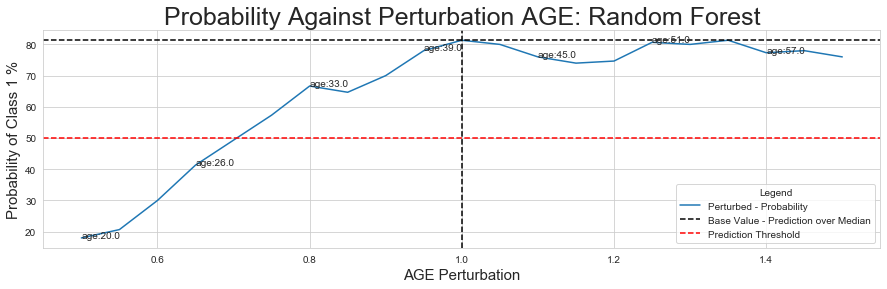

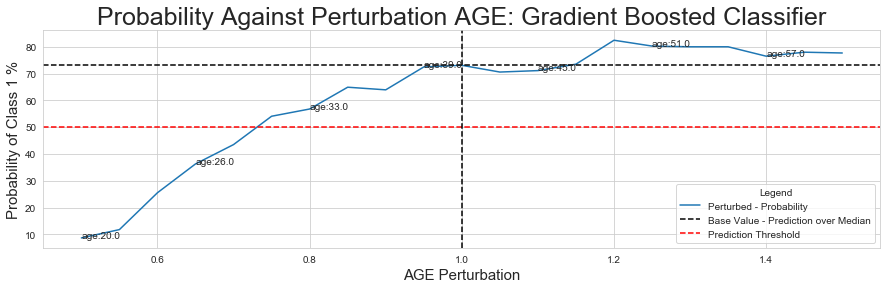

In [12]:
#Showing Samples
perturb_graph(model = logit,data = X_test_holdout, column = 'age', title = 'Logit')
perturb_graph(model = rfc,data = X_test_holdout, column = 'age', title = 'Random Forest')
perturb_graph(model = gbc,data = X_test_holdout, column ='age', title = 'Gradient Boosted Classifier')


In [13]:
def perturb_graph_cons(data, column, title = 'Label with Model Type: GBC/RFC/etc..'):
    '''
    Parameters:
        data: df object
        column: pass dataframe column, e.g, age, fnlwgt etc. Can pass a list of columns, e.g., ['age', 'fnlwgt']
        title: str; pass title of graph 
    
    Returns:
        Perturbed Input Graph. Shows all models simultaneously, as opposed to the above
    
    '''
    clone = data.copy()
    column = column

    rfc_base_value = rfc.predict_proba(clone.median().values.reshape(
        (1, X_test_holdout.shape[1])))[:, 1] * 100
    gbc_base_value = gbc.predict_proba(clone.median().values.reshape(
        (1, X_test_holdout.shape[1])))[:, 1] * 100
    logit_base_value = logit.predict_proba(
        clone.median().values.reshape(
            (1, X_test_holdout.shape[1])))[:, 1] * 100

    a = [str(i) + '%' for i in range(0, 201) if i % 5 == 0]
    b = [(i / 100) for i in range(0, 201) if i % 5 == 0]
    pertu = dict(zip(a, b))
    pert = [i for i in pertu.values()]

    rfc_preds = []
    gbc_preds = []
    logit_preds = []

    for i in pert:
        clone[column] = data[column] * (i)
        rfc_preds.append(
            rfc.predict_proba(clone.median().values.reshape(
                (1, clone.shape[1])))[:, 1][0] * 100)
        gbc_preds.append(
            gbc.predict_proba(clone.median().values.reshape(
                (1, clone.shape[1])))[:, 1][0] * 100)
        logit_preds.append(
            logit.predict_proba(clone.median().values.reshape(
                (1, clone.shape[1])))[:, 1][0] * 100)

    fig, ax1 = plt.subplots(1, 1, figsize=(17, 4))
    sns.lineplot(x=pert, y=rfc_preds, ax=ax1)
    sns.lineplot(x=pert, y=gbc_preds, ax=ax1)
    sns.lineplot(x=pert, y=logit_preds, ax=ax1)
    ax1.axhline(50, ls='--', color='k')
    ax1.axvline(1.0, ls='--', color='r')
    #ax1.axhline(base_value, ls='--',color = 'r')
    #ax1.text(.5,.72, "Base Value - Prediction over mean ", fontsize=13)
    ax1.set_title('Probability Against Perturbation {}: {}'.format(
        column, title),
                  fontsize=25)
    ax1.set_xlabel('{} Perturbation'.format(column), fontsize=15)
    ax1.set_ylabel('Probability of Class 1', fontsize=15)
    plt.legend(title='Model',
               loc='upper left',
               labels=[
                   'Random Forest', 'Gradient Boosted Classifier',
                   'Logistic Regression', 'Prediction Threshold',
                   'Baseline Probability'
               ])

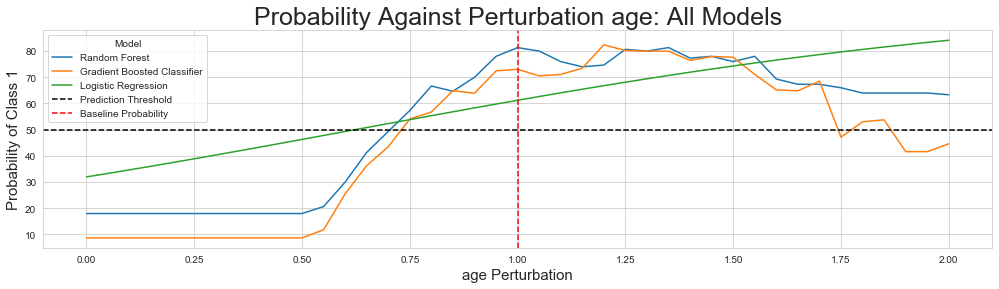

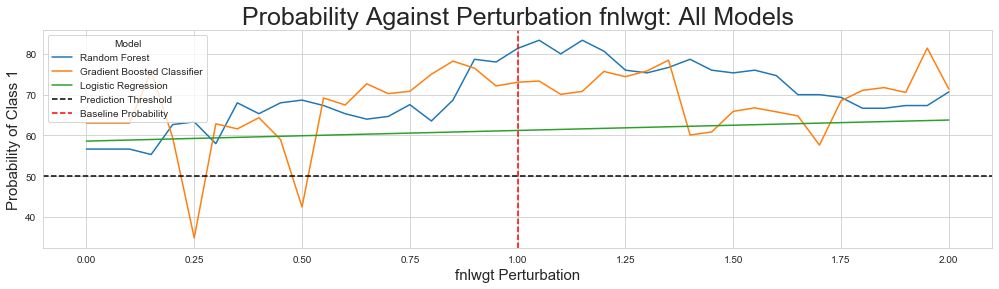

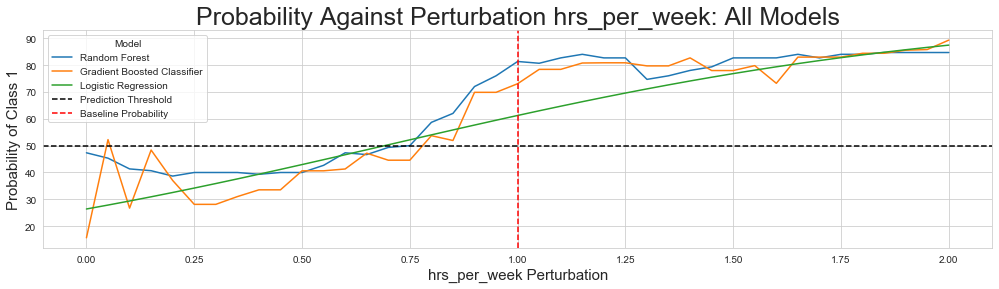

In [14]:
perturb_graph_cons(data = X_test_holdout, column = 'age', title = 'All Models')
perturb_graph_cons(data = X_test_holdout, column = 'fnlwgt', title = 'All Models')
perturb_graph_cons(data = X_test_holdout, column = 'hrs_per_week', title = 'All Models')

Lime (Local) Explanations

In [15]:
import keras
import lime
import lime.lime_tabular


#Keras and Sklearn have different ways of showing prediction probabilities. Keras == model.predict, sklearn == model.predict_proba
def explain_lime(model, train, test, observation, seed = 1, num_features = 10):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
            Keras Neural Network = keras_ann
            Sklearn Neural Network = sk_ann
        train: object; train set dataframe
        test: object; test set dataframe
        observation: int (index of explanation on test data set)
        seed: int; default to 1
        num_features: int, the number of features to be displayed in explanation
        
    Returns:
        Local explanations over test set - Summary
    '''

    if type(model) == keras.engine.training.Model:
        predict_fn = lambda x: model.predict(encoder.transform(x).toarray())
    else:
        predict_fn = lambda x: model.predict_proba(encoder.transform(x)).astype(float)

    explainer = lime.lime_tabular.LimeTabularExplainer(
        train,
        feature_names=feature_names,
        class_names=class_names,
        categorical_features=categorical_features,
        categorical_names=categorical_names,
        kernel_width=3)

    np.random.seed(seed)
    i = observation

    exp = explainer.explain_instance(test[i], predict_fn, num_features= num_features)
    exp.show_in_notebook(show_all=True)

    print('-' * 125)    
    print("Looking at Observation: {}".format(i))
    print("Actual Class Label: {}".format(y_test[i]))   
    %matplotlib inline
    try: #If Keras
        print("Predicted Class Label: {}".format(np.argmax(model.predict(encoder.transform(test).toarray()),axis = 1)[i]))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict(encoder.transform(test).toarray())[i]*100)))
        print('-' * 125)
        print("Displaying Local Explanation for Prediction......")
    except: #If Sklearn
        print('-' * 125)
        print("Predicted Class Label: {}".format(np.argmax(model.predict_proba(encoder.transform(test[i].reshape(1,-1))).astype(float))
        ))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict_proba(encoder.transform(test[i].reshape(1,-1)))[0])*100))
        print('-' * 125)
        print("Displaying Local Explanation for Prediction: Top {} Features......".format(num_features))
    fig = exp.as_pyplot_figure()

-----------------------------------------------------------------------------------------------------------------------------
Looking at Observation: 3000
Actual Class Label: 1
-----------------------------------------------------------------------------------------------------------------------------
Predicted Class Label: 0
Prediction Confidence (Prob): 70.72%
-----------------------------------------------------------------------------------------------------------------------------
Displaying Local Explanation for Prediction: Top 10 Features......


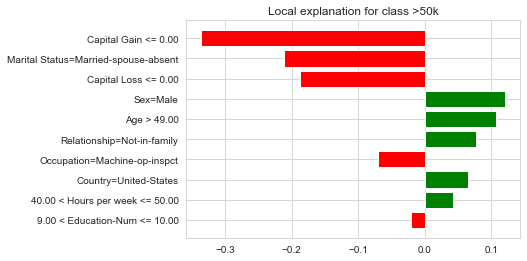

In [16]:
explain_lime(model = logit, train = X_train, test = X_test, observation=3000)

Shap (Local & Global Explanations)

In [17]:
#Put Data in Shap Friendly Format
import shap
X_train_shap = pd.DataFrame(encoded_train.toarray(), columns=features)
X_test_shap = pd.DataFrame(encoder.transform(X_test).toarray(),
                           columns=features)
X_shap = pd.concat([X_train_shap, X_test_shap])

In [18]:
#Local Explainability

#Only need to run this once. Pickled all Shap values.
#def get_shap_values(model):
#    if type(model) == keras.engine.training.Model:
#        f = lambda x: model.predict(x)[:, 1]
#    else:
#        f = lambda x: model.predict_proba(x)[:, 1]
#    med = X_train_shap.median().values.reshape((1, X_train_shap.shape[1]))
#    explainer = shap.KernelExplainer(f, med)
#    shap_values = explainer.shap_values(X_test_shap)
#    return shap_values


#rfc_shap_values = get_shap_values(rfc)
#gbc_shap_values = get_shap_values(gbc)
#logit_shap_values = get_shap_values(logit)
#sk_ann_shap_values = get_shap_values(sk_ann)
#keras_ann_shap_values = get_shap_values(keras_ann)

#shap_values = {'rfc' : rfc_shap_values, 'gbc' : gbc_shap_values, 'logit' : logit_shap_values,
#'sklearn_ann' : sk_ann_shap_values, 'keras_ann' : keras_ann_shap_values}

#save_obj(shap_values, 'shap_values')
#shap_values


#def get_base_values(model):
#    #Keras doesn't have a model.predict_proba function. It outputs the probabilities via predict method
#    if type(model) == keras.engine.training.Model:
#        f = lambda x: model.predict(x)[:, 1]
#    else:
#        f = lambda x: model.predict_proba(x)[:, 1]
#    #We use the median as a proxy for computational efficiency. Rather than getting the expected value over the whole
#    #training distribution, we get E(f(x)) over the median of the training set, e.g., model.predict(median(xi))
#    med = X_train_shap.median().values.reshape((1, X_train_shap.shape[1]))
#    explainer = shap.KernelExplainer(f, med)
#    return explainer.expected_value
    


#rfc_base_value = get_base_values(rfc)
#gbc_base_value = get_base_values(gbc)
#logit_base_value = get_base_values(logit)
#sk_ann_base_value = get_base_values(sk_ann)
#keras_ann_base_value = get_base_values(keras_ann)

#base_values =  {'rfc' : rfc_base_value, 'gbc' : gbc_base_value, 'logit' : logit_base_value,
#'sklearn_ann' : sk_ann_base_value, 'keras_ann' : keras_ann_base_value}




In [19]:
import shap
import warnings
warnings.filterwarnings('ignore')
shap.initjs()

shap_values = load_obj('shap_values')  #Load Dict of Shap Values
models = {
    'rfc': 'Random Forest',
    'gbc': 'Gradient Boosted Classifier',
    'logit': 'Logistic Regression',
    'neuralnet': 'Sklearn MultiLayer Perceptron',
    'keras_ann': 'Keras Multilayer Perceptron'
}

In [20]:
def shap_local_graph(model, train, observation, model_str):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
            Keras Neural Network = keras_ann
            Sklearn Neural Network = sk_ann
        train: object; train set dataframe
        observation: int
        model_str: str, string of model name to map from dict of shap values
            'rfc' : rfc_shap_values, 
            'gbc' : gbc_shap_values, 
            'logit' : logit_shap_values, 
            'sklearn_ann' : sk_ann_shap_values
            'keras_ann' : keras_ann_shap_values
        
    Returns:
        Local Shap Explanation
    
    '''
    #Keras doesn't have a model.predict_proba function. It outputs the probabilities via predict method
    if type(model) == keras.engine.training.Model:
        f = lambda x: model.predict(x)[:, 1]
    else:
        f = lambda x: model.predict_proba(x)[:, 1]
    #We use the median as a proxy for computational efficiency. Rather than getting the expected value over the whole
    #training distribution, we get E(f(x)) over the median of the training set, e.g., model.predict(median(xi))
    med = train.median().values.reshape((1, train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    print("{} Shap Values".format(models[model_str]))

    return shap.force_plot(
        explainer.
        expected_value,  #Expected value is the base value - E(mean(f(x)))
        shap_values[model_str][observation],
        feature_names=features)


#plot_cmap=['#808080', '#0000FF']

In [21]:
#Testing
#shap_local_graph(model=keras_ann, train = X_train_shap, observation=2, model_str='keras_ann')
shap_local_graph(model=logit, train = X_train_shap, observation=3000, model_str='logit')
#shap_local_graph(model=rfc, train = X_train_shap, observation=3000, model_str='rfc')
#shap_local_graph(model=gbc, train = X_train_shap, observation=3000, model_str='gbc')

Logistic Regression Shap Values


In [22]:
def shap_many_graph(model, train, test, model_str):
    '''
    Parameters:
    model: object,
        Random Forest: rfc
        Gradient Boosted Classifier: gbc
        Logistic Regression: logit
        Keras Neural Network = keras_ann
        Sklearn Neural Network = sk_ann
    train: object; train set dataframe
    test: object; test set dataframe
    model_str: str, string of model name to map from dict
        'rfc' : rfc_shap_values, 
        'gbc' : gbc_shap_values, 
        'logit' : logit_shap_values, 
        'sklearn_ann' : sk_ann_shap_values
        keras_ann' : keras_ann_shap_values
        
    Returns:
    Global Shap Explanations over test set
    
    '''
    #Keras doesn't have a model.predict_proba function. It outputs the probabilities via predict method
    if type(model) == keras.engine.training.Model:
        f = lambda x: model.predict(x)[:, 1]
    else:
        f = lambda x: model.predict_proba(x)[:, 1]
    med = train.median().values.reshape((1, train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    return shap.force_plot(explainer.expected_value, shap_values[model_str],
                           test)

In [23]:
#Testing
shap_many_graph(keras_ann, train = X_train_shap, test = X_test_shap, model_str='keras_ann')

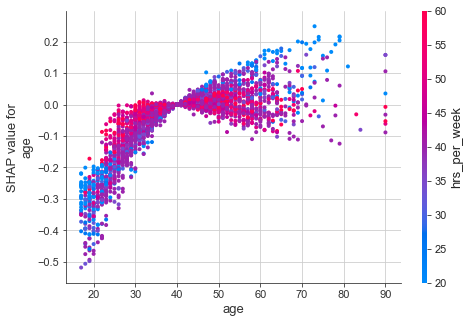

In [24]:
shap.dependence_plot("age", shap_values['keras_ann'], X_test_shap)

In [25]:
def shap_summary_graph(model, train, test, model_str):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
            Keras Neural Network = keras_ann
            Sklearn Neural Network = sk_ann
        train: object; train set dataframe
        test: object; test set dataframe
        model_str: str, string of model name to map from dict
            'rfc' : rfc_shap_values, 
            'gbc' : gbc_shap_values, 
            'logit' : logit_shap_values, 
            'sklearn_ann' : sk_ann_shap_values
            keras_ann' : keras_ann_shap_values
        
    Returns:
    Global Shap Explanations over test set - Summary
    '''
    if type(model) == keras.engine.training.Model:
        f = lambda x: model.predict(x)[:, 1]
    else:
        f = lambda x: model.predict_proba(x)[:, 1]
    med = train.median().values.reshape((1, train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    print("{} Shap Values".format(models[model_str]))
    return shap.summary_plot(shap_values[model_str],
                             test,
                             class_names=class_names,
                             plot_type="violin")

Keras Multilayer Perceptron Shap Values


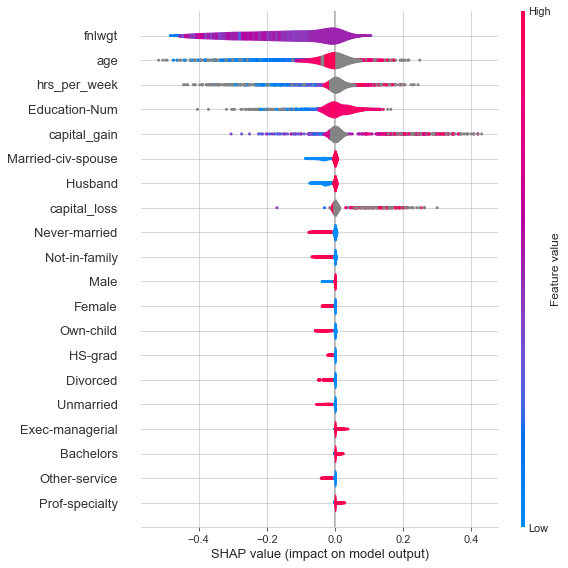

Logistic Regression Shap Values


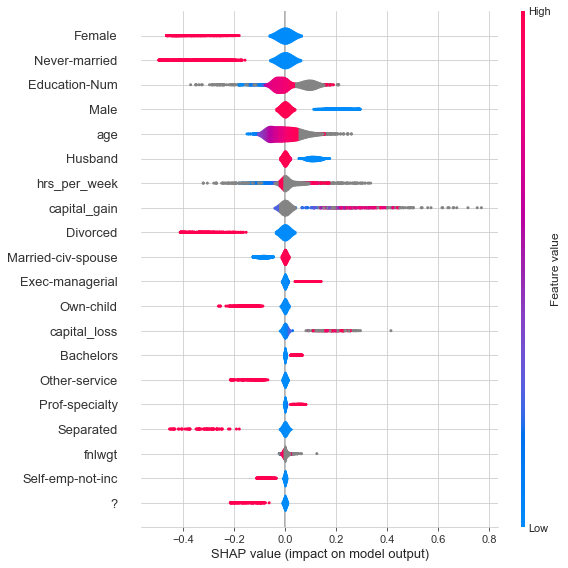

Random Forest Shap Values


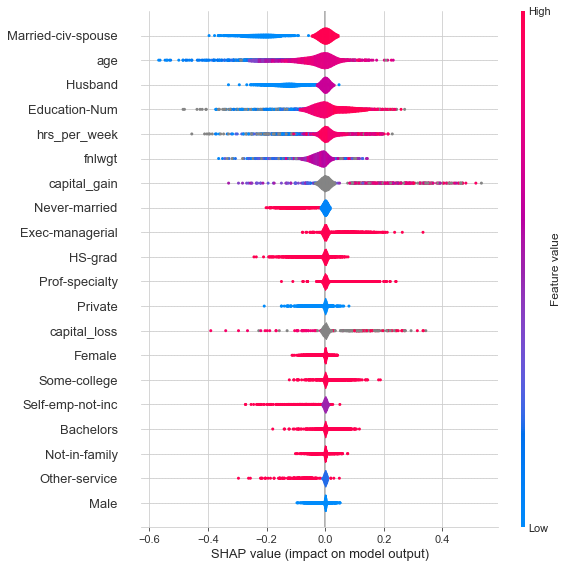

Gradient Boosted Classifier Shap Values


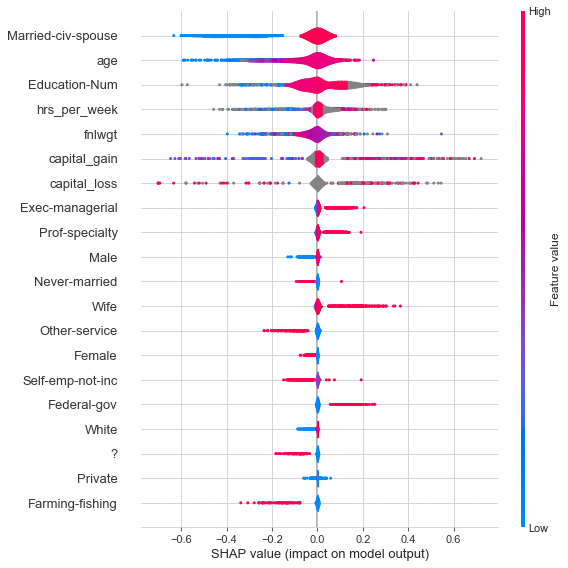

In [26]:
#Testing
shap_summary_graph(keras_ann, train = X_train_shap, test = X_test_shap, model_str='keras_ann')
#shap_summary_graph(sk_ann, data = X_train_shap, model_str='sklearn_ann')
shap_summary_graph(logit, train = X_train_shap, test = X_test_shap, model_str='logit')
shap_summary_graph(rfc, train = X_train_shap, test = X_test_shap, model_str='rfc')
shap_summary_graph(gbc, train = X_train_shap, test = X_test_shap, model_str='gbc')

Working with Integrated Gradients

In [324]:
from IntegratedGradients.IntegratedGradients import *
#from keras.layers import Dense
#from keras.layers.core import Activation
from keras.layers import Input, Dense

_input = Input(shape=[107])
probs = Dense(1, activation='sigmoid')(_input)

model1 = Model(inputs=_input, outputs=probs)
model1.compile(optimizer='sgd', loss='binary_crossentropy')
model1.fit(X_train, y_train, epochs=1000, batch_size=128, verbose=0)
#keras_ann.summary()

In [359]:
ig = integrated_gradients(keras_ann)

Evaluated output channel (0-based index): All
Building gradient functions
Progress: 100.0%
Done.


In [360]:
#ig = integrated_gradients(keras_ann)
#from collections import OrderedDict

def fetch_grads(test_data):
    grads = []
    for i in test_data.toarray():
        grads.append(ig.explain(i, num_steps= 100))
    return pd.DataFrame(grads, columns = features)

    
ig_df = fetch_grads(encoded_test)    
#visualize_ig(test_data= encoded_test, observation= 3000)


In [361]:
ig_df


,?,Federal-gov,Local-gov,Never-worked,Private,Self-emp-inc,Self-emp-not-inc,State-gov,Without-pay,10th,...,Trinadad&Tobago,United-States,Vietnam,Yugoslavia,age,fnlwgt,Education-Num,capital_gain,capital_loss,hrs_per_week
0,0.000000,-0.000000,-0.000000,0.0,0.002161,-0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,-0.003604,0.0,-0.0,-0.185201,-0.083743,-0.196341,0.000000,-0.000000,-0.206336
1,0.000000,-0.000000,-0.000000,0.0,0.001843,-0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,-0.001813,0.0,-0.0,-0.192960,-0.189532,-0.230598,0.000000,-0.000000,-0.210559
2,0.000000,-0.000000,-0.000000,0.0,0.002122,-0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,-0.002782,0.0,-0.0,-0.141889,-0.271656,-0.176683,0.000000,-0.000000,-0.241342
3,0.000000,-0.000000,0.000000,0.0,0.001044,-0.000000,-0.000000,0.000000,0.0,0.000000,...,0.0,-0.000487,0.0,-0.0,-0.114676,0.079393,-0.053933,-0.783047,-0.000000,-0.113090
4,0.002908,-0.000000,-0.000000,0.0,0.000000,-0.000000,-0.000000,0.000000,0.0,0.002648,...,0.0,-0.001030,0.0,-0.0,-0.218273,0.009530,-0.048795,-0.550418,-0.000000,-0.165743
5,0.000000,-0.000000,0.000000,0.0,0.000000,-0.001521,-0.000000,0.000000,0.0,0.000000,...,0.0,-0.000487,0.0,-0.0,-0.174936,0.106630,-0.072812,-0.689633,-0.000000,-0.142449
6,0.000000,-0.000000,-0.000000,0.0,0.000000,-0.000000,0.000374,0.000000,0.0,0.000000,...,0.0,-0.001778,0.0,-0.0,-0.186558,-0.165461,-0.207684,0.000000,-0.000000,-0.249651
7,0.000000,-0.000000,0.000000,0.0,0.002225,-0.000000,-0.000000,0.000000,0.0,0.000000,...,0.0,-0.001606,0.0,-0.0,-0.322679,0.197508,-0.219211,-0.000000,-0.232350,-0.261031
8,0.000000,-0.000000,-0.000000,0.0,0.001290,-0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,-0.002379,0.0,-0.0,-0.160515,-0.296144,-0.162489,0.000000,0.000000,-0.144046
9,0.009082,-0.000000,-0.000000,0.0,0.000000,-0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,-0.004184,0.0,-0.0,-0.123432,0.088703,-0.184609,0.000000,-0.000000,-0.217206


In [357]:
np.round(np.array(shap_values['keras_ann'])[0],2)

array([ 0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.01,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.01, -0.17,  0.03,  0.  ,  0.  ,  0.03])

In [251]:
#local = pd.DataFrame(shap_values['gbc'],
#                         columns=features).iloc[:,-4:]
#local.to_csv('obj\\gbc_local.csv')

#from gam import gam
#gam = gam.GAM(attributions_path='obj\\gbc_local.csv')
#gam.generate()

In [250]:
#gam.plot()

In [252]:
#a = gam.explanations[0]
#sorted_by_second = sorted(a, key=lambda tup: tup[1], reverse=True)
#sorted_by_second